# Face Generation
In this project, you'll use generative adversarial networks to generate new images of faces.
### Get the Data
You'll be using two datasets in this project:
- MNIST
- CelebA

Since the celebA dataset is complex and you're doing GANs in a project for the first time, we want you to test your neural network on MNIST before CelebA.  Running the GANs on MNIST will allow you to see how well your model trains sooner.

If you're using [FloydHub](https://www.floydhub.com/), set `data_dir` to "/input" and use the [FloydHub data ID](http://docs.floydhub.com/home/using_datasets/) "R5KrjnANiKVhLWAkpXhNBe".

In [7]:
data_dir = './data'

# FloydHub - Use with data ID "R5KrjnANiKVhLWAkpXhNBe"
#data_dir = '/input'


"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
import helper

helper.download_extract('mnist', data_dir)
helper.download_extract('celeba', data_dir)

Found mnist Data
Found celeba Data


## Explore the Data
### MNIST
As you're aware, the [MNIST](http://yann.lecun.com/exdb/mnist/) dataset contains images of handwritten digits. You can view the first number of examples by changing `show_n_images`. 

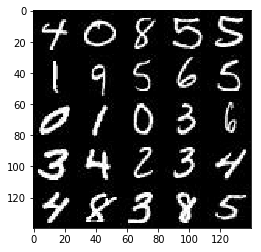

In [8]:
show_n_images = 25

"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
%matplotlib inline
import os
from glob import glob
from matplotlib import pyplot

mnist_images = helper.get_batch(glob(os.path.join(data_dir, 'mnist/*.jpg'))[:show_n_images], 28, 28, 'L')
pyplot.imshow(helper.images_square_grid(mnist_images, 'L'), cmap='gray')

### CelebA
The [CelebFaces Attributes Dataset (CelebA)](http://mmlab.ie.cuhk.edu.hk/projects/CelebA.html) dataset contains over 200,000 celebrity images with annotations.  Since you're going to be generating faces, you won't need the annotations.  You can view the first number of examples by changing `show_n_images`.

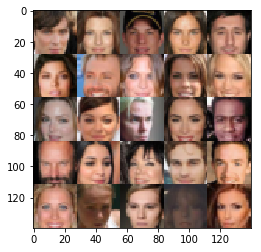

In [9]:
show_n_images = 25

"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
mnist_images = helper.get_batch(glob(os.path.join(data_dir, 'img_align_celeba/*.jpg'))[:show_n_images], 28, 28, 'RGB')
pyplot.imshow(helper.images_square_grid(mnist_images, 'RGB'))

## Preprocess the Data
Since the project's main focus is on building the GANs, we'll preprocess the data for you.  The values of the MNIST and CelebA dataset will be in the range of -0.5 to 0.5 of 28x28 dimensional images.  The CelebA images will be cropped to remove parts of the image that don't include a face, then resized down to 28x28.

The MNIST images are black and white images with a single [color channel](https://en.wikipedia.org/wiki/Channel_(digital_image%29) while the CelebA images have [3 color channels (RGB color channel)](https://en.wikipedia.org/wiki/Channel_(digital_image%29#RGB_Images).
## Build the Neural Network
You'll build the components necessary to build a GANs by implementing the following functions below:
- `model_inputs`
- `discriminator`
- `generator`
- `model_loss`
- `model_opt`
- `train`

### Check the Version of TensorFlow and Access to GPU
This will check to make sure you have the correct version of TensorFlow and access to a GPU

In [10]:
"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
from distutils.version import LooseVersion
import warnings
import tensorflow as tf

# Check TensorFlow Version
assert LooseVersion(tf.__version__) >= LooseVersion('1.0'), 'Please use TensorFlow version 1.0 or newer.  You are using {}'.format(tf.__version__)
print('TensorFlow Version: {}'.format(tf.__version__))

# Check for a GPU
if not tf.test.gpu_device_name():
    warnings.warn('No GPU found. Please use a GPU to train your neural network.')
else:
    print('Default GPU Device: {}'.format(tf.test.gpu_device_name()))

TensorFlow Version: 1.0.0
Default GPU Device: /gpu:0


### Input
Implement the `model_inputs` function to create TF Placeholders for the Neural Network. It should create the following placeholders:
- Real input images placeholder with rank 4 using `image_width`, `image_height`, and `image_channels`.
- Z input placeholder with rank 2 using `z_dim`.
- Learning rate placeholder with rank 0.

Return the placeholders in the following the tuple (tensor of real input images, tensor of z data)

In [11]:
import problem_unittests as tests

def model_inputs(image_width, image_height, image_channels, z_dim):
    """
    Create the model inputs
    :param image_width: The input image width
    :param image_height: The input image height
    :param image_channels: The number of image channels
    :param z_dim: The dimension of Z
    :return: Tuple of (tensor of real input images, tensor of z data, learning rate)
    """
    # DONE: Implement Function
    inputs_real = tf.placeholder(tf.float32, (None, image_width, image_height, image_channels), name='inputs_real')
    inputs_z = tf.placeholder(tf.float32, (None, z_dim), name="input_z")
    learning_rate = tf.placeholder(tf.float32, name="learning_rate")

    return inputs_real, inputs_z, learning_rate


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_model_inputs(model_inputs)

Tests Passed


### Discriminator
Implement `discriminator` to create a discriminator neural network that discriminates on `images`.  This function should be able to reuse the variabes in the neural network.  Use [`tf.variable_scope`](https://www.tensorflow.org/api_docs/python/tf/variable_scope) with a scope name of "discriminator" to allow the variables to be reused.  The function should return a tuple of (tensor output of the generator, tensor logits of the generator).

In [27]:
def discriminator(images, reuse=False, alpha=0.2):
    """
    Create the discriminator network
    :param image: Tensor of input image(s)
    :param reuse: Boolean if the weights should be reused
    :return: Tuple of (tensor output of the discriminator, tensor logits of the discriminator)
    """
    # DONE: Implement Function
    with tf.variable_scope('discriminator', reuse=reuse):
        # Hidden layer 1
        h1 = tf.layers.conv2d(images, 64, 5, strides=2, padding="SAME",
                              kernel_initializer=tf.contrib.layers.xavier_initializer())
        lrelu1 = tf.maximum(alpha * h1, h1)
        #print ('Layer 1:', lrelu1.shape)
        # 14x14x64 now
        
        # Hidden Layer 2
        h2 = tf.layers.conv2d(lrelu1, 128, 5, strides=1, padding="SAME",
                              kernel_initializer=tf.contrib.layers.xavier_initializer())
        bn2 = tf.layers.batch_normalization(h2, training=True)
        lrelu2 = tf.maximum(alpha * bn2, bn2)
        #print ('Layer 2:', lrelu2.shape)
        # 14x14x128 now
        
        # Hidden Layer 3
        h3 = tf.layers.conv2d(lrelu2, 256, 5, strides=2, padding="SAME", 
                             kernel_initializer=tf.contrib.layers.xavier_initializer())
        bn3 = tf.layers.batch_normalization(h3, training=True)
        lrelu3 = tf.maximum(alpha * bn3, bn3)
        #print ('Layer 3:', lrelu3.shape)
        #7x7x256 now
        
        flat = tf.reshape(lrelu3, (-1, 7*7*256))
        logits = tf.layers.dense(flat, 1)
        out = tf.sigmoid(logits)

        return out, logits


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_discriminator(discriminator, tf)

Tests Passed


### Generator
Implement `generator` to generate an image using `z`. This function should be able to reuse the variabes in the neural network.  Use [`tf.variable_scope`](https://www.tensorflow.org/api_docs/python/tf/variable_scope) with a scope name of "generator" to allow the variables to be reused. The function should return the generated 28 x 28 x `out_channel_dim` images.

In [28]:
def generator(z, out_channel_dim, is_train=True, alpha=0.2):
    """
    Create the generator network
    :param z: Input z
    :param out_channel_dim: The number of channels in the output image
    :param is_train: Boolean if generator is being used for training
    :return: The tensor output of the generator
    """
    # DONE: Implement Function 
        
    with tf.variable_scope('generator', reuse=not is_train):
        # First fully connected layer
        h1 = tf.layers.dense(z, 7*7*256)
        
        # Reshape it to start the convolutional stack
        h1 = tf.reshape(h1, (-1, 7, 7, 256))
        bn1 = tf.layers.batch_normalization(h1, training=is_train)
        lrelu1 = tf.maximum(alpha * bn1, bn1)
        #print ('Layer 1:', lrelu1.shape)
        # 4x4x256 now
        
        # Hidden Layer 2
        h2 = tf.layers.conv2d_transpose(lrelu1, 128, 5, strides=1, padding="SAME",
                                       kernel_initializer=tf.contrib.layers.xavier_initializer())
        bn2 = tf.layers.batch_normalization(h2, training=is_train)
        lrelu2 = tf.maximum(alpha * bn2, bn2)
        #print ('Layer 2:', lrelu2.shape)
        # 8x8x128 now
        
        # Hidden Layer 3
        h3 = tf.layers.conv2d_transpose(lrelu2, 64, 5, strides=2, padding='SAME',
                                       kernel_initializer=tf.contrib.layers.xavier_initializer())
        bn3 = tf.layers.batch_normalization(h3, training=is_train)
        lrelu3 = tf.maximum(alpha * bn3, bn3)
        #print ('Layer 3:', h3.shape)
        # 16x16x64
        
        # Output layer, 28x28x5
        logits = tf.layers.conv2d_transpose(lrelu3, out_channel_dim, 5, strides=2, padding="SAME",
                                           kernel_initializer=tf.contrib.layers.xavier_initializer())
        
        out = tf.tanh(logits)
        #print ('Output:', logits.shape)
        
        return out


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_generator(generator, tf)

Tests Passed


### Loss
Implement `model_loss` to build the GANs for training and calculate the loss.  The function should return a tuple of (discriminator loss, generator loss).  Use the following functions you implemented:
- `discriminator(images, reuse=False)`
- `generator(z, out_channel_dim, is_train=True)`

In [101]:
def model_loss(input_real, input_z, out_channel_dim):
    """
    Get the loss for the discriminator and generator
    :param input_real: Images from the real dataset
    :param input_z: Z input
    :param out_channel_dim: The number of channels in the output image
    :return: A tuple of (discriminator loss, generator loss)
    """
    # DONE: Implement Function
    
    # Generator network 
    g_model = generator(input_z, out_channel_dim, is_train=True)

    # Disriminator network
    _, d_logits_real = discriminator(input_real)
    _, d_logits_fake = discriminator(g_model, reuse=True)

    # Calculate losses                                                           
    d_loss = tf.reduce_mean(d_logits_fake) - tf.reduce_mean(d_logits_real)
    g_loss = -tf.reduce_mean(d_logits_fake)
    
    alpha = tf.random_uniform(
        shape=[28,1], 
        minval=0.,
        maxval=1.
    )
    
    
    real_data = input_real
    fake_data = g_model
    LAMBDA = 10
    
    differences = fake_data - real_data
    interpolates = real_data + (alpha*differences)
    _, temp = discriminator(interpolates, reuse=True)
    gradients = tf.gradients(temp, [interpolates])[0]
    slopes = tf.sqrt(tf.reduce_sum(tf.square(gradients), reduction_indices=[1]))
    gradient_penalty = tf.reduce_mean((slopes-1.)**2)
    d_loss += LAMBDA*gradient_penalty
    
    return d_loss, g_loss


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
#print("done")
tests.test_model_loss(model_loss)

Tests Passed


### Optimization
Implement `model_opt` to create the optimization operations for the GANs. Use [`tf.trainable_variables`](https://www.tensorflow.org/api_docs/python/tf/trainable_variables) to get all the trainable variables.  Filter the variables with names that are in the discriminator and generator scope names.  The function should return a tuple of (discriminator training operation, generator training operation).

In [102]:
def model_opt(d_loss, g_loss, learning_rate, beta1):
    """
    Get optimization operations
    :param d_loss: Discriminator loss Tensor
    :param g_loss: Generator loss Tensor
    :param learning_rate: Learning Rate Placeholder
    :param beta1: The exponential decay rate for the 1st moment in the optimizer
    :return: A tuple of (discriminator training operation, generator training operation)
    """
    # DONE: Implement Function
    
    # Get the trainable_variables, split into G and D parts
    t_vars = tf.trainable_variables()
    g_vars = [var for var in t_vars if var.name.startswith('generator')]
    d_vars = [var for var in t_vars if var.name.startswith('discriminator')]

    d_train_opt = tf.train.AdamOptimizer(learning_rate, beta1=beta1, beta2=0.9).minimize(d_loss, var_list=d_vars)
    
    # https://blog.metaflow.fr/tensorflow-mutating-variables-and-control-flow-2181dd238e62
    update_ops = tf.get_collection(tf.GraphKeys.UPDATE_OPS)
    g_updates = [opt for opt in update_ops if opt.name.startswith('generator')]
    with tf.control_dependencies(g_updates):
        g_train_opt = tf.train.AdamOptimizer(learning_rate, beta1=beta1, beta2=0.9).minimize(g_loss, var_list=g_vars)
    
    return d_train_opt, g_train_opt


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_model_opt(model_opt, tf)

Tests Passed


## Neural Network Training
### Show Output
Use this function to show the current output of the generator during training. It will help you determine how well the GANs is training.

In [103]:
"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
import numpy as np

def show_generator_output(sess, n_images, input_z, out_channel_dim, image_mode):
    """
    Show example output for the generator
    :param sess: TensorFlow session
    :param n_images: Number of Images to display
    :param input_z: Input Z Tensor
    :param out_channel_dim: The number of channels in the output image
    :param image_mode: The mode to use for images ("RGB" or "L")
    """
    cmap = None if image_mode == 'RGB' else 'gray'
    z_dim = input_z.get_shape().as_list()[-1]
    example_z = np.random.uniform(-1, 1, size=[n_images, z_dim])

    samples = sess.run(
        generator(input_z, out_channel_dim, False),
        feed_dict={input_z: example_z})

    images_grid = helper.images_square_grid(samples, image_mode)
    pyplot.imshow(images_grid, cmap=cmap)
    pyplot.show()

### Train
Implement `train` to build and train the GANs.  Use the following functions you implemented:
- `model_inputs(image_width, image_height, image_channels, z_dim)`
- `model_loss(input_real, input_z, out_channel_dim)`
- `model_opt(d_loss, g_loss, learning_rate, beta1)`

Use the `show_generator_output` to show `generator` output while you train. Running `show_generator_output` for every batch will drastically increase training time and increase the size of the notebook.  It's recommended to print the `generator` output every 100 batches.

In [107]:
import matplotlib.pyplot as plt

def train(epoch_count, batch_size, z_dim, learning_rate, beta1, get_batches, data_shape, data_image_mode):
    """
    Train the GAN
    :param epoch_count: Number of epochs
    :param batch_size: Batch Size
    :param z_dim: Z dimension
    :param learning_rate: Learning Rate
    :param beta1: The exponential decay rate for the 1st moment in the optimizer
    :param get_batches: Function to get batches
    :param data_shape: Shape of the data
    :param data_image_mode: The image mode to use for images ("RGB" or "L")
    """
    # DONE: Build Model   
    
    # Set the image width, height, and image channels
    _, image_width, image_height, image_channels = data_shape
    
    # Impliment model_inputs and set the input_real, input_z, and learning rate
    input_real, input_z, _learning_rate = model_inputs(image_width, image_height, image_channels, z_dim)
    
    # Impliment model_loss and set the d_loss and g_loss
    d_loss, g_loss = model_loss(input_real, input_z, image_channels)
    
    # Impliment model_opt and set d_train_opt and g_train_opt
    d_train_opt, g_train_opt = model_opt(d_loss, g_loss, learning_rate, beta1)
    
    # Set batch counter
    batch_count = 0
    g_count = 0
    
    # Set number of images to print
    n_images = 25
    
    n_disc = 5
    
    losses = []
    
    with tf.Session() as sess:
        sess.run(tf.global_variables_initializer())
        for e in range(epoch_count):
            for batch_images in get_batches(batch_size):
                
                # Multiply batch_images by 2.0 since the dataset ranges from -0.5 to 0.5
                batch_images = batch_images*2.0
                
                # Sample random noise for G
                batch_z = np.random.uniform(-1, 1, size=(batch_size, z_dim))
                
                # Run optimizers
                _ = sess.run(d_train_opt, feed_dict={input_real: batch_images, input_z: batch_z})
                
                if batch_count % n_disc == 0:
                    _ = sess.run(g_train_opt, feed_dict={input_z: batch_z})
                
                # Increment the batch_count
                batch_count += 1  
                    
                # Print the generator output every 100 batches
                if (batch_count % batch_size == 0):
                    show_generator_output(sess, n_images, input_z, image_channels, data_image_mode)
                    
                    # At the end of each epoch, get the losses and print them out - scale images to -1 - 1
                    train_loss_d = d_loss.eval({input_z: batch_z, input_real: batch_images})
                    train_loss_g = g_loss.eval({input_z: batch_z})
                    
                     # Save losses to view after training
                    losses.append((train_loss_d, train_loss_g))
                    
                    print("Epoch {}/{}...".format(e+1, epochs),
                          "Discriminator Loss: {:.4f}...".format(train_loss_d),
                          "Generator Loss: {:.4f}".format(train_loss_g))
                    
    # Plot training losses                    
    fig, ax = plt.subplots()
    losses = np.array(losses)
    plt.plot(losses.T[0], label='Discriminator', alpha=0.5)
    plt.plot(losses.T[1], label='Generator', alpha=0.5)
    plt.title("Training Losses")
    plt.legend() 

### MNIST
Test your GANs architecture on MNIST.  After 2 epochs, the GANs should be able to generate images that look like handwritten digits.  Make sure the loss of the generator is lower than the loss of the discriminator or close to 0.

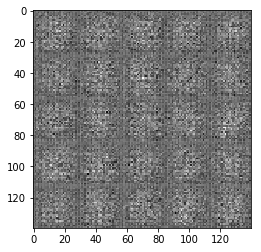

Epoch 1/3... Discriminator Loss: -100.7770... Generator Loss: 42.3458


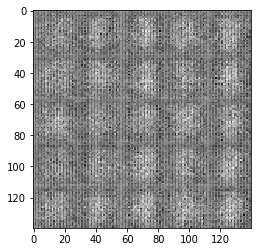

Epoch 1/3... Discriminator Loss: -135.5949... Generator Loss: 46.3334


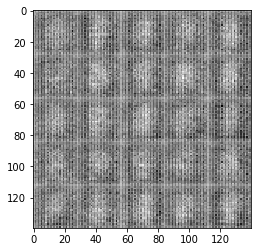

Epoch 1/3... Discriminator Loss: -123.0622... Generator Loss: 36.5944


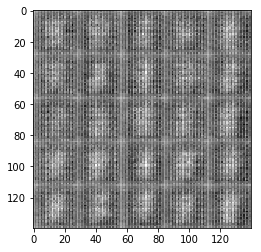

Epoch 1/3... Discriminator Loss: -111.5044... Generator Loss: 78.3782


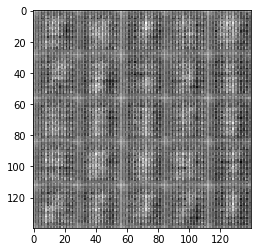

Epoch 1/3... Discriminator Loss: -106.8173... Generator Loss: 68.2852


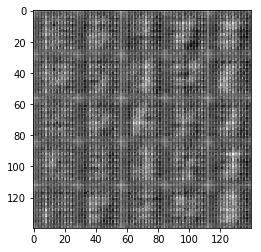

Epoch 1/3... Discriminator Loss: -116.5967... Generator Loss: 93.4825


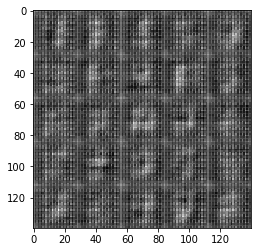

Epoch 1/3... Discriminator Loss: -118.2165... Generator Loss: 73.2857


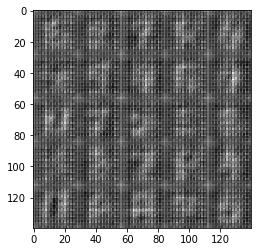

Epoch 1/3... Discriminator Loss: -140.7285... Generator Loss: 104.9395


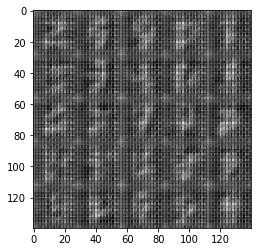

Epoch 1/3... Discriminator Loss: -56.3336... Generator Loss: 94.8732


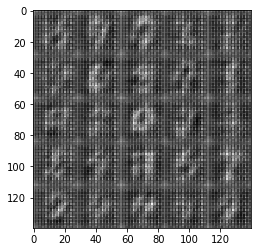

Epoch 1/3... Discriminator Loss: -121.0213... Generator Loss: 108.0368


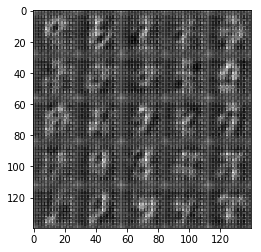

Epoch 1/3... Discriminator Loss: -168.4854... Generator Loss: 103.2310


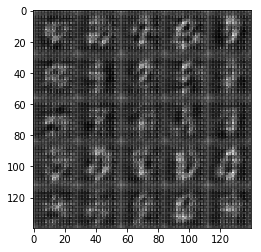

Epoch 1/3... Discriminator Loss: -167.2309... Generator Loss: 68.5129


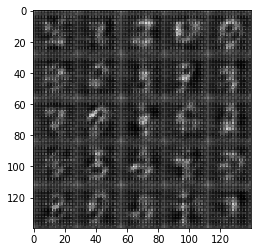

Epoch 1/3... Discriminator Loss: -61.4060... Generator Loss: 125.6882


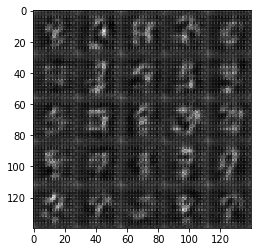

Epoch 1/3... Discriminator Loss: -196.6646... Generator Loss: 75.7136


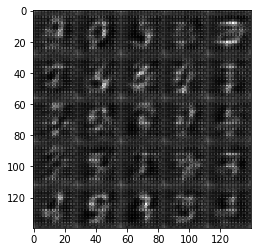

Epoch 1/3... Discriminator Loss: -177.6708... Generator Loss: 139.0157


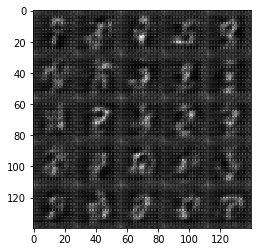

Epoch 1/3... Discriminator Loss: -112.6007... Generator Loss: 169.0585


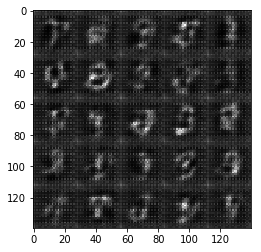

Epoch 1/3... Discriminator Loss: -107.7401... Generator Loss: 179.3130


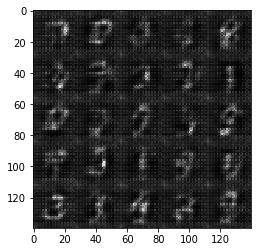

Epoch 1/3... Discriminator Loss: -168.0297... Generator Loss: 113.9727


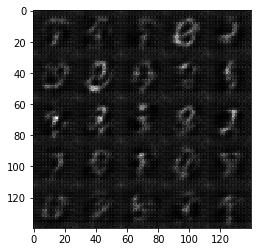

Epoch 1/3... Discriminator Loss: -250.5706... Generator Loss: 144.1980


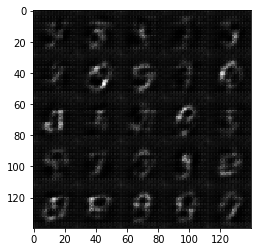

Epoch 1/3... Discriminator Loss: -109.3345... Generator Loss: 253.0307


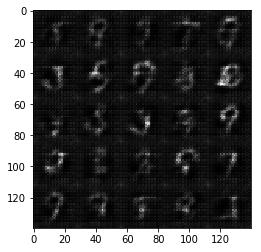

Epoch 1/3... Discriminator Loss: -90.3275... Generator Loss: 239.0598


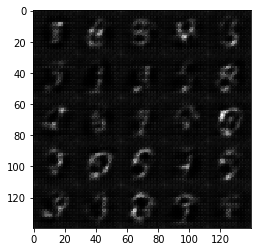

Epoch 1/3... Discriminator Loss: -265.8750... Generator Loss: 168.2693


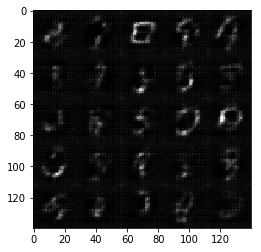

Epoch 1/3... Discriminator Loss: -67.0202... Generator Loss: 269.3778


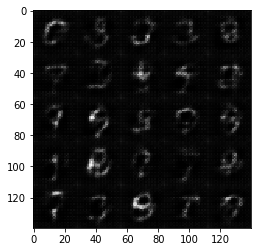

Epoch 1/3... Discriminator Loss: -210.4069... Generator Loss: 131.9823


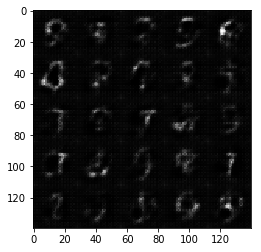

Epoch 2/3... Discriminator Loss: -273.1279... Generator Loss: 149.0643


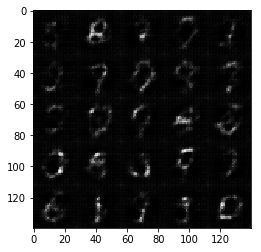

Epoch 2/3... Discriminator Loss: -89.6726... Generator Loss: 248.9029


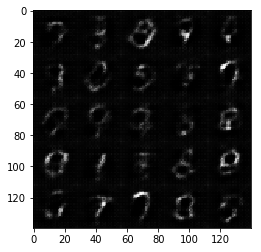

Epoch 2/3... Discriminator Loss: -253.8226... Generator Loss: 185.2526


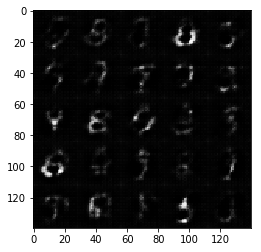

Epoch 2/3... Discriminator Loss: -186.1169... Generator Loss: 236.4773


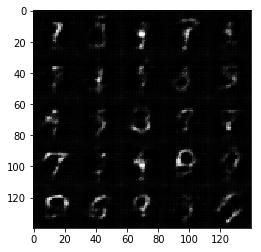

Epoch 2/3... Discriminator Loss: -274.2859... Generator Loss: 96.1285


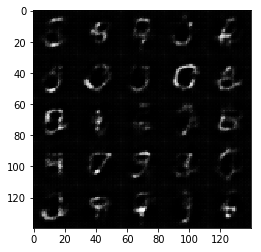

Epoch 2/3... Discriminator Loss: -269.2554... Generator Loss: 219.2979


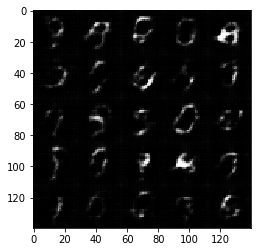

Epoch 2/3... Discriminator Loss: -229.1519... Generator Loss: 228.0688


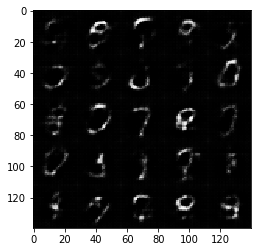

Epoch 2/3... Discriminator Loss: -143.9147... Generator Loss: 307.4194


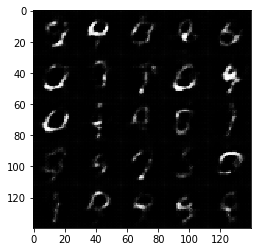

Epoch 2/3... Discriminator Loss: -294.5670... Generator Loss: 221.6446


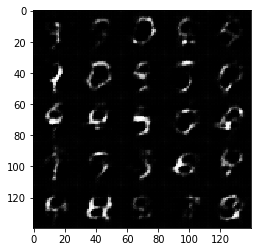

Epoch 2/3... Discriminator Loss: -264.9745... Generator Loss: 206.3237


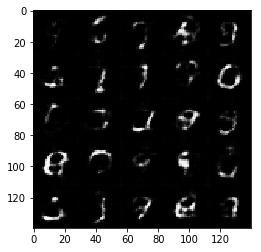

Epoch 2/3... Discriminator Loss: -89.9578... Generator Loss: 350.9782


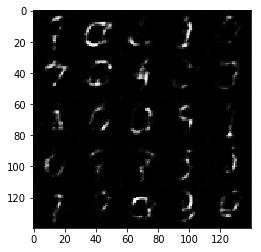

Epoch 2/3... Discriminator Loss: -308.9617... Generator Loss: 272.5004


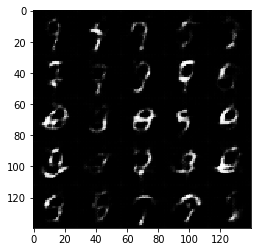

Epoch 2/3... Discriminator Loss: -407.8552... Generator Loss: 108.7793


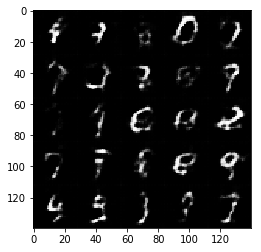

Epoch 2/3... Discriminator Loss: -388.4208... Generator Loss: 157.5500


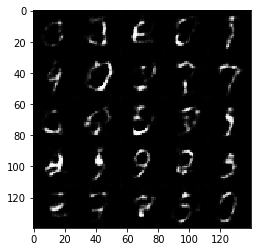

Epoch 2/3... Discriminator Loss: -131.4677... Generator Loss: 412.2402


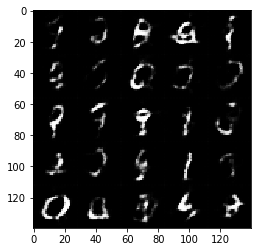

Epoch 2/3... Discriminator Loss: -383.5899... Generator Loss: 141.0529


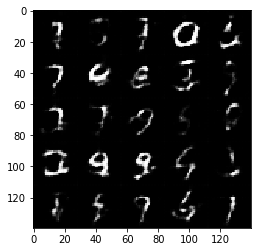

Epoch 2/3... Discriminator Loss: -409.7015... Generator Loss: 376.0557


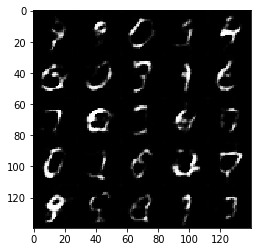

Epoch 2/3... Discriminator Loss: -383.7832... Generator Loss: 262.4516


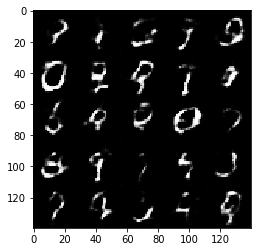

Epoch 2/3... Discriminator Loss: -344.1280... Generator Loss: 335.2187


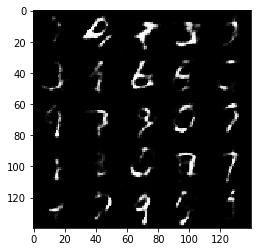

Epoch 2/3... Discriminator Loss: -490.8021... Generator Loss: 249.9281


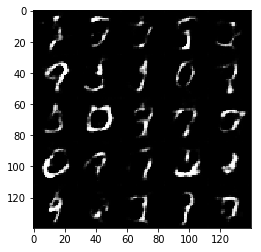

Epoch 2/3... Discriminator Loss: -410.0709... Generator Loss: 386.1224


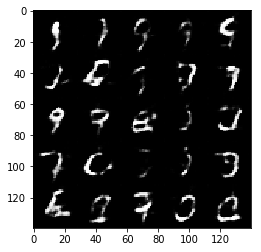

Epoch 2/3... Discriminator Loss: -600.3220... Generator Loss: 318.5945


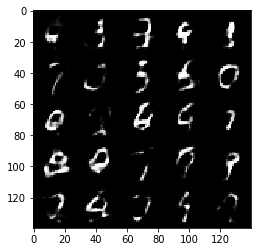

Epoch 2/3... Discriminator Loss: -150.8789... Generator Loss: 460.3876


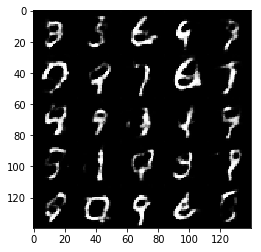

Epoch 2/3... Discriminator Loss: -205.7688... Generator Loss: 450.1935


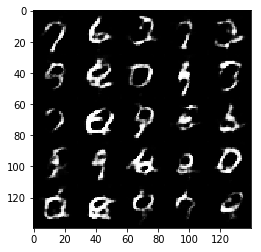

Epoch 3/3... Discriminator Loss: -623.8940... Generator Loss: 291.8625


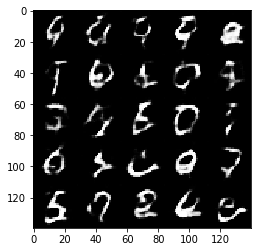

Epoch 3/3... Discriminator Loss: -494.0214... Generator Loss: 475.7989


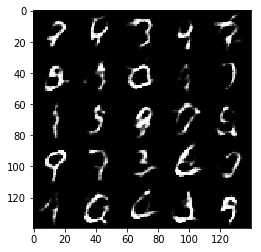

Epoch 3/3... Discriminator Loss: -572.4140... Generator Loss: 492.7714


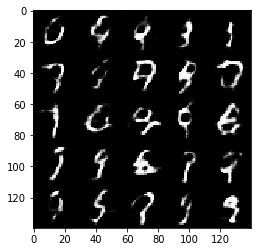

Epoch 3/3... Discriminator Loss: -661.6541... Generator Loss: 415.5056


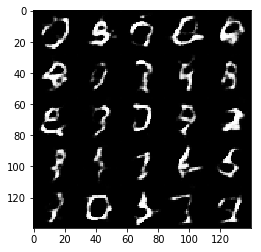

Epoch 3/3... Discriminator Loss: -624.7397... Generator Loss: 188.0260


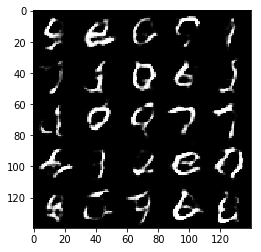

Epoch 3/3... Discriminator Loss: -770.3721... Generator Loss: 435.3606


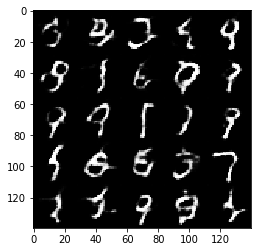

Epoch 3/3... Discriminator Loss: -493.2501... Generator Loss: 566.2059


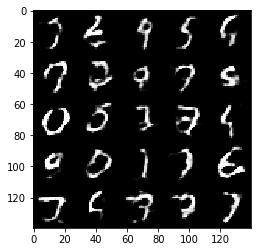

Epoch 3/3... Discriminator Loss: -545.4705... Generator Loss: 624.9663


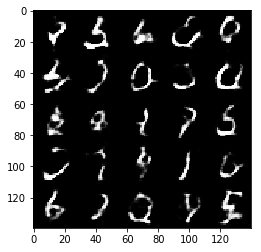

Epoch 3/3... Discriminator Loss: -622.7287... Generator Loss: 427.7642


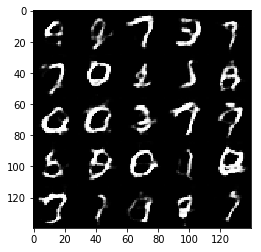

Epoch 3/3... Discriminator Loss: -513.4943... Generator Loss: 613.0763


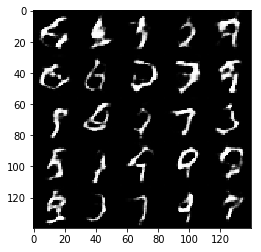

Epoch 3/3... Discriminator Loss: -724.8044... Generator Loss: 257.4611


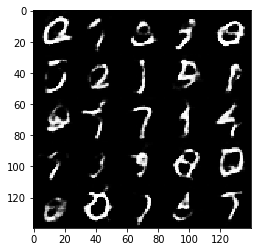

Epoch 3/3... Discriminator Loss: -407.8972... Generator Loss: 698.3428


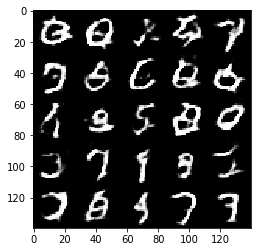

Epoch 3/3... Discriminator Loss: -988.2736... Generator Loss: 359.8876


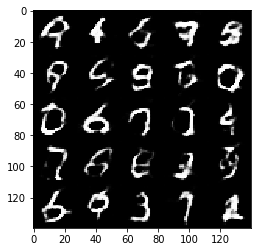

Epoch 3/3... Discriminator Loss: -1029.2871... Generator Loss: 406.7686


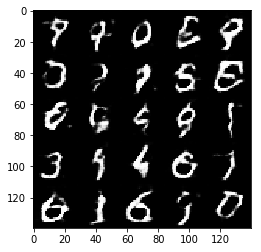

Epoch 3/3... Discriminator Loss: -975.3521... Generator Loss: 497.0512


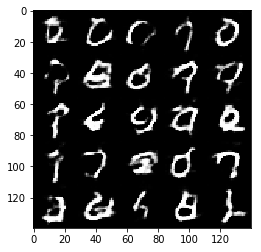

Epoch 3/3... Discriminator Loss: -839.5281... Generator Loss: 382.4705


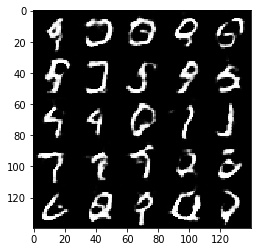

Epoch 3/3... Discriminator Loss: -1008.9946... Generator Loss: 598.6454


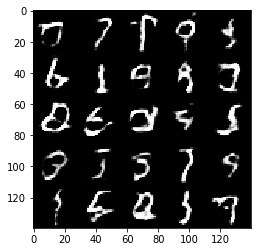

Epoch 3/3... Discriminator Loss: -952.1478... Generator Loss: 361.5555


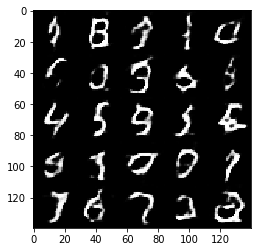

Epoch 3/3... Discriminator Loss: -783.7394... Generator Loss: 572.0424


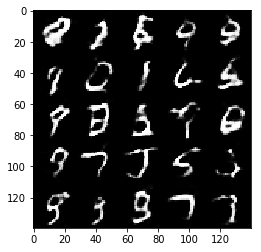

Epoch 3/3... Discriminator Loss: -366.4283... Generator Loss: 712.9214


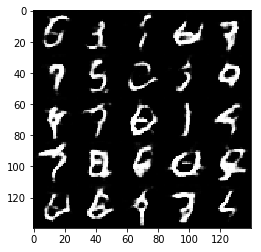

Epoch 3/3... Discriminator Loss: -1038.1182... Generator Loss: 612.0165


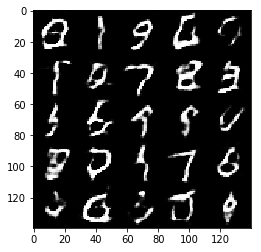

Epoch 3/3... Discriminator Loss: -1025.6859... Generator Loss: 554.9684


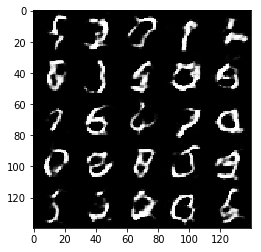

Epoch 3/3... Discriminator Loss: -1208.7107... Generator Loss: 443.0907


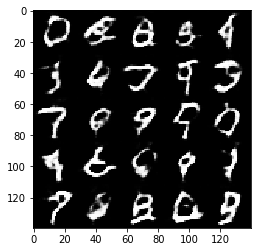

Epoch 3/3... Discriminator Loss: -1193.2926... Generator Loss: 335.6141


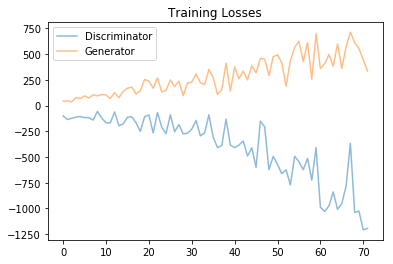

In [105]:
batch_size = 50
z_dim = 128
learning_rate = 1e-4
beta1 = 0.5


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
epochs = 3

mnist_dataset = helper.Dataset('mnist', glob(os.path.join(data_dir, 'mnist/*.jpg')))
with tf.Graph().as_default():
    train(epochs, batch_size, z_dim, learning_rate, beta1, mnist_dataset.get_batches,
          mnist_dataset.shape, mnist_dataset.image_mode)

### CelebA
Run your GANs on CelebA.  It will take around 20 minutes on the average GPU to run one epoch.  You can run the whole epoch or stop when it starts to generate realistic faces.

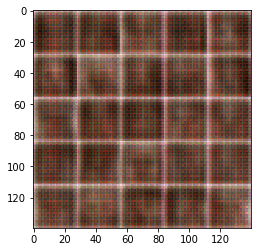

Epoch 1/2... Discriminator Loss: -393.2114... Generator Loss: 238.7289


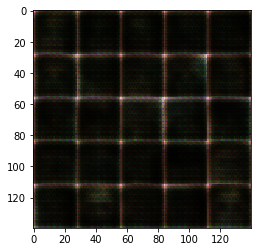

Epoch 1/2... Discriminator Loss: -29.6375... Generator Loss: 235.0304


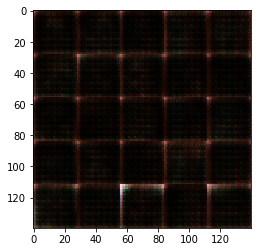

Epoch 1/2... Discriminator Loss: -90.9697... Generator Loss: 170.4391


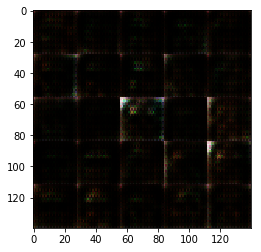

Epoch 1/2... Discriminator Loss: -2842.8496... Generator Loss: 1392.2770


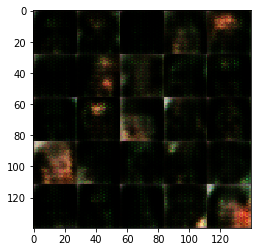

Epoch 1/2... Discriminator Loss: -38.8170... Generator Loss: 2015.5081


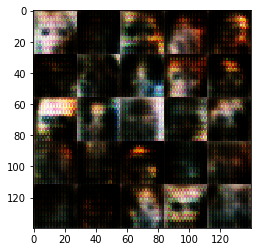

Epoch 1/2... Discriminator Loss: -5888.2520... Generator Loss: 2853.9612


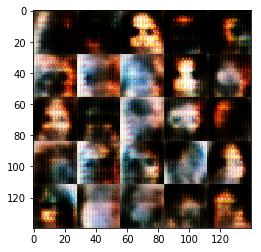

Epoch 1/2... Discriminator Loss: -8952.8652... Generator Loss: 4449.3115


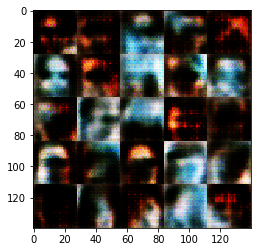

Epoch 1/2... Discriminator Loss: -42.9774... Generator Loss: 5985.8447


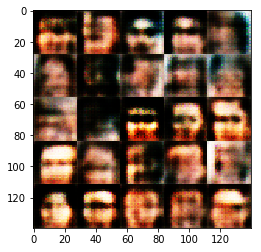

Epoch 1/2... Discriminator Loss: -75.2214... Generator Loss: 5680.6211


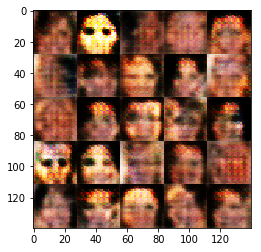

Epoch 1/2... Discriminator Loss: -43.4548... Generator Loss: 5586.5918


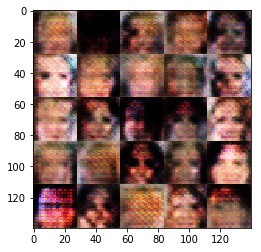

Epoch 1/2... Discriminator Loss: 43.0330... Generator Loss: 5572.0591


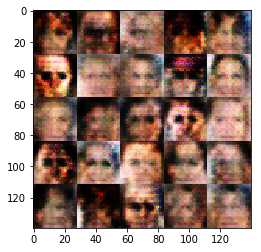

Epoch 1/2... Discriminator Loss: -51.7260... Generator Loss: 5593.8154


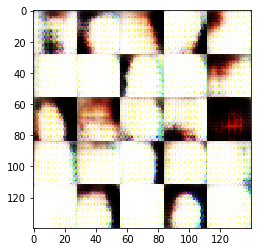

Epoch 1/2... Discriminator Loss: -14298.4961... Generator Loss: 7003.7148


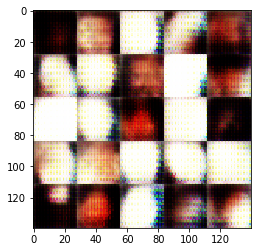

Epoch 1/2... Discriminator Loss: -20159.6973... Generator Loss: 9827.9434


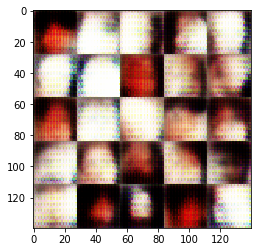

Epoch 1/2... Discriminator Loss: -25382.9980... Generator Loss: 12389.1953


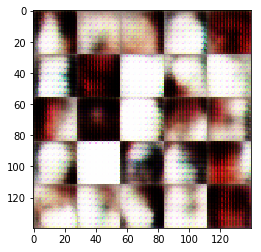

Epoch 1/2... Discriminator Loss: -29.2028... Generator Loss: 13010.9092


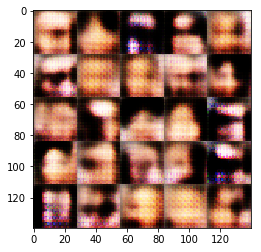

Epoch 1/2... Discriminator Loss: -217.0193... Generator Loss: 13057.8408


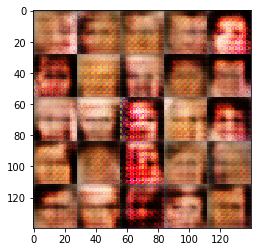

Epoch 1/2... Discriminator Loss: -28.1554... Generator Loss: 13173.8398


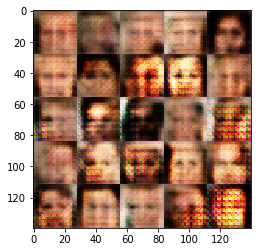

Epoch 1/2... Discriminator Loss: -15.3714... Generator Loss: 13277.5322


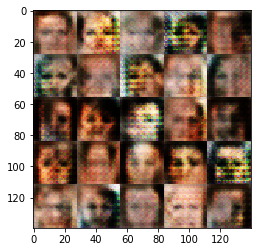

Epoch 1/2... Discriminator Loss: -28.7063... Generator Loss: 13230.0098


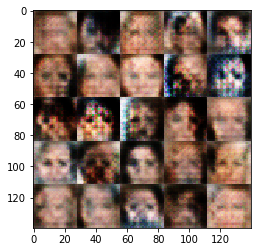

Epoch 1/2... Discriminator Loss: 13.7979... Generator Loss: 13257.4453


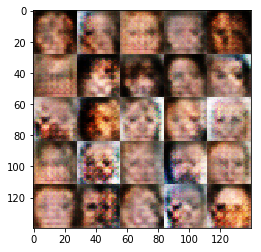

Epoch 1/2... Discriminator Loss: -25.0524... Generator Loss: 13261.9766


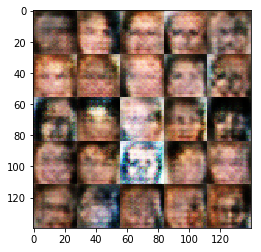

Epoch 1/2... Discriminator Loss: -20.4695... Generator Loss: 13243.1777


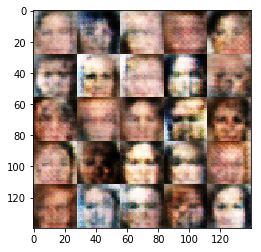

Epoch 1/2... Discriminator Loss: -28.7463... Generator Loss: 13280.4980


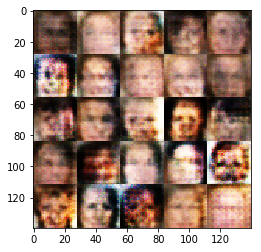

Epoch 1/2... Discriminator Loss: -36.9994... Generator Loss: 13222.0840


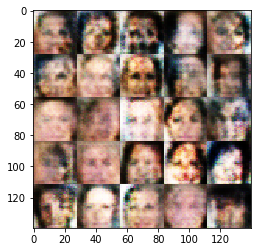

Epoch 1/2... Discriminator Loss: -0.5371... Generator Loss: 13115.0312


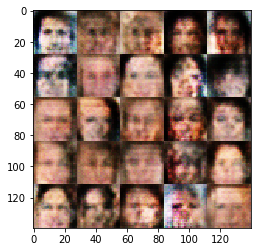

Epoch 1/2... Discriminator Loss: -88.9768... Generator Loss: 12999.2695


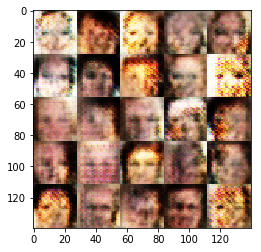

Epoch 1/2... Discriminator Loss: -17.8668... Generator Loss: 12788.1533


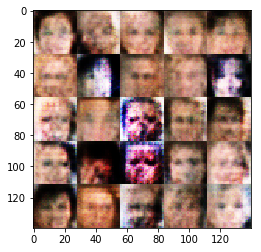

Epoch 1/2... Discriminator Loss: -39.4488... Generator Loss: 12709.3896


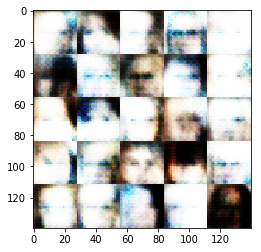

Epoch 1/2... Discriminator Loss: -26027.4375... Generator Loss: 12967.1621


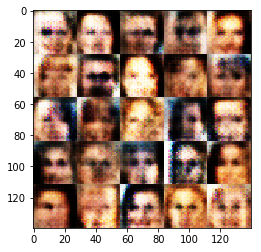

Epoch 1/2... Discriminator Loss: -75.8712... Generator Loss: 13632.6709


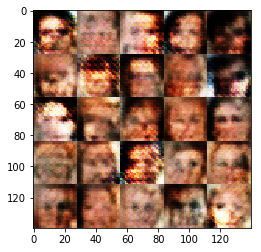

Epoch 1/2... Discriminator Loss: -14.5620... Generator Loss: 13770.5898


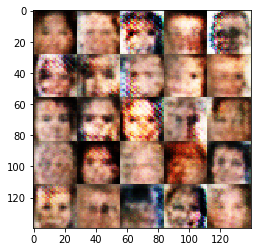

Epoch 1/2... Discriminator Loss: -16.4781... Generator Loss: 13666.8857


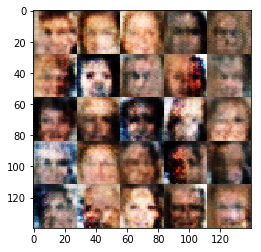

Epoch 1/2... Discriminator Loss: -26.1730... Generator Loss: 13701.8301


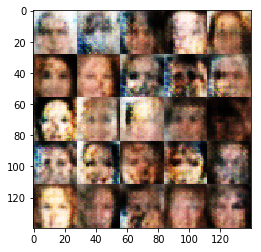

Epoch 1/2... Discriminator Loss: -30.3128... Generator Loss: 13713.4395


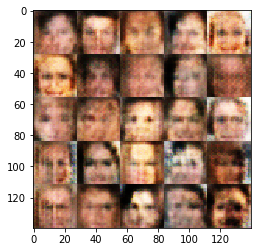

Epoch 1/2... Discriminator Loss: -44.3827... Generator Loss: 13701.3174


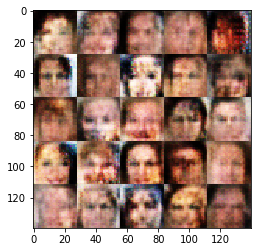

Epoch 1/2... Discriminator Loss: -55.9503... Generator Loss: 13645.2109


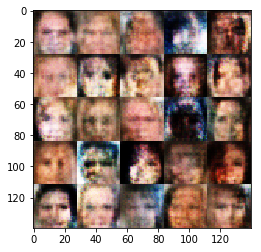

Epoch 1/2... Discriminator Loss: -74.9053... Generator Loss: 13573.9639


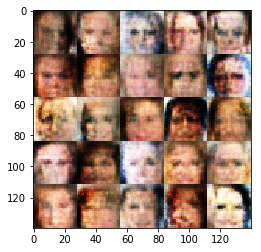

Epoch 1/2... Discriminator Loss: -3.6981... Generator Loss: 13223.1318


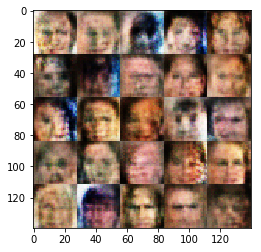

Epoch 1/2... Discriminator Loss: -164.5073... Generator Loss: 13318.4756


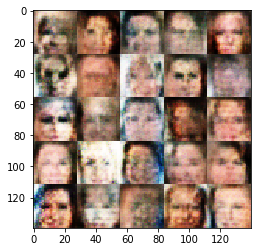

Epoch 1/2... Discriminator Loss: -110.0725... Generator Loss: 13165.0361


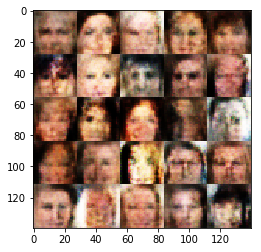

Epoch 1/2... Discriminator Loss: -182.2636... Generator Loss: 12953.8750


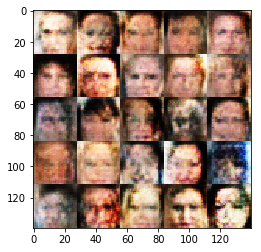

Epoch 1/2... Discriminator Loss: -62.6506... Generator Loss: 12673.6465


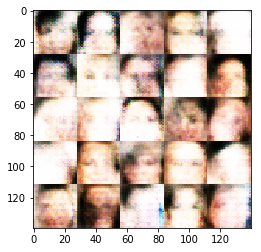

Epoch 1/2... Discriminator Loss: -3017.3860... Generator Loss: 6746.8267


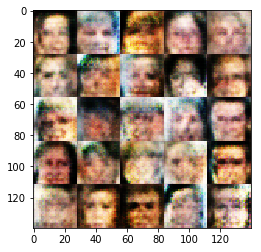

Epoch 1/2... Discriminator Loss: -77.2985... Generator Loss: 12328.0469


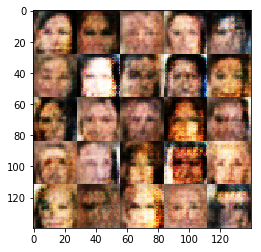

Epoch 1/2... Discriminator Loss: -139.8284... Generator Loss: 12463.4395


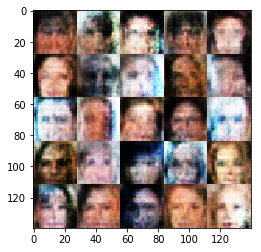

Epoch 1/2... Discriminator Loss: -47.4456... Generator Loss: 12691.6924


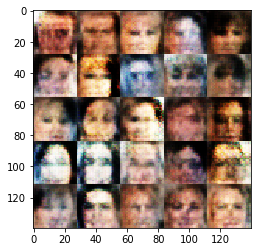

Epoch 1/2... Discriminator Loss: -150.2486... Generator Loss: 12804.7109


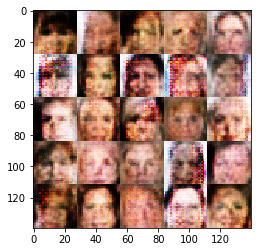

Epoch 1/2... Discriminator Loss: -167.9797... Generator Loss: 12545.5898


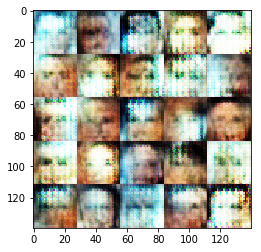

Epoch 2/2... Discriminator Loss: -420.6564... Generator Loss: 11344.7500


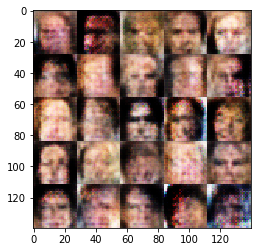

Epoch 2/2... Discriminator Loss: -111.8650... Generator Loss: 12144.4199


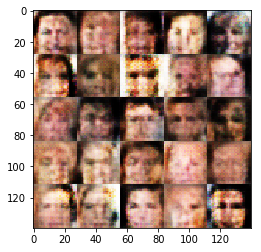

Epoch 2/2... Discriminator Loss: -32.0216... Generator Loss: 12135.6836


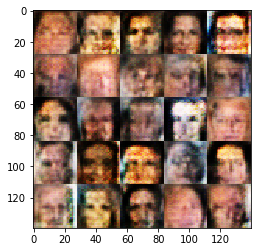

Epoch 2/2... Discriminator Loss: 69.3545... Generator Loss: 12059.4277


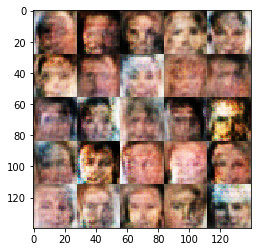

Epoch 2/2... Discriminator Loss: -262.5069... Generator Loss: 11958.9141


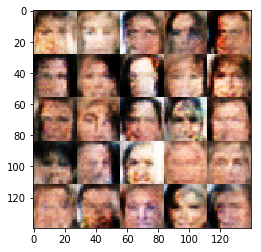

Epoch 2/2... Discriminator Loss: 81.7800... Generator Loss: 11699.9863


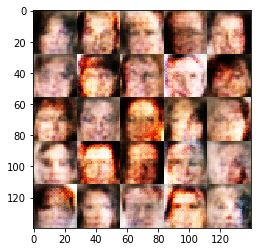

Epoch 2/2... Discriminator Loss: 38.8000... Generator Loss: 12502.0186


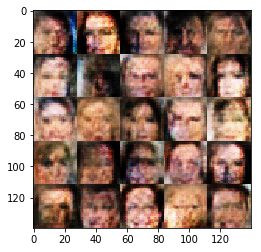

Epoch 2/2... Discriminator Loss: -16.3247... Generator Loss: 12252.7754


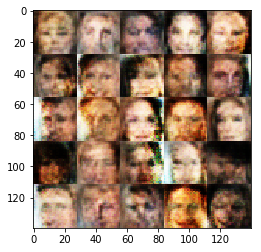

Epoch 2/2... Discriminator Loss: -20.1553... Generator Loss: 12237.9062


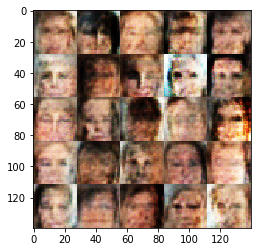

Epoch 2/2... Discriminator Loss: -113.1826... Generator Loss: 12266.7422


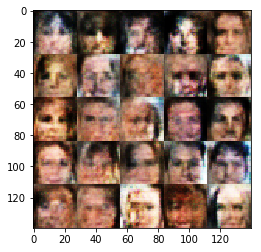

Epoch 2/2... Discriminator Loss: -71.8336... Generator Loss: 12111.9951


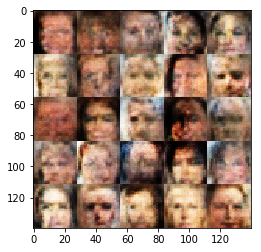

Epoch 2/2... Discriminator Loss: 91.8199... Generator Loss: 11746.9258


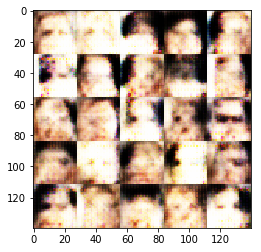

Epoch 2/2... Discriminator Loss: -193.5351... Generator Loss: 13136.7031


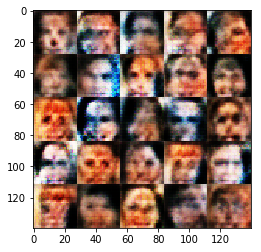

Epoch 2/2... Discriminator Loss: -87.6755... Generator Loss: 13255.3691


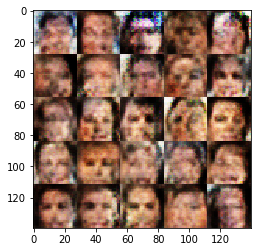

Epoch 2/2... Discriminator Loss: -232.7486... Generator Loss: 13018.7832


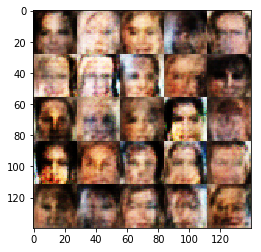

Epoch 2/2... Discriminator Loss: -338.3358... Generator Loss: 12714.3506


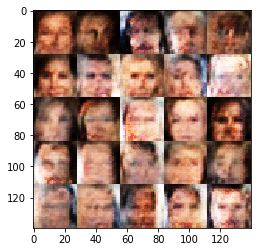

Epoch 2/2... Discriminator Loss: 127.3915... Generator Loss: 11055.7354


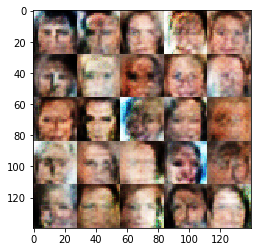

Epoch 2/2... Discriminator Loss: -449.3724... Generator Loss: 12675.5449


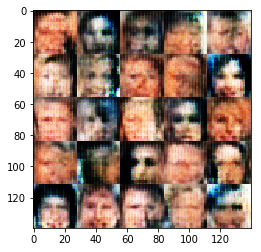

Epoch 2/2... Discriminator Loss: 70.3925... Generator Loss: 12359.0332


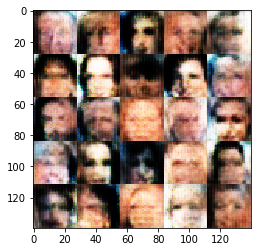

Epoch 2/2... Discriminator Loss: -184.3706... Generator Loss: 12350.0830


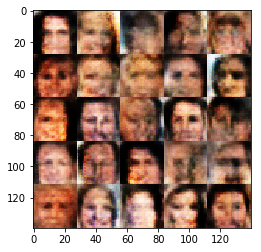

Epoch 2/2... Discriminator Loss: -4.5755... Generator Loss: 12392.6875


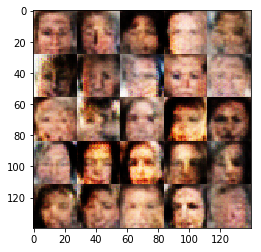

Epoch 2/2... Discriminator Loss: -29.3318... Generator Loss: 12333.7998


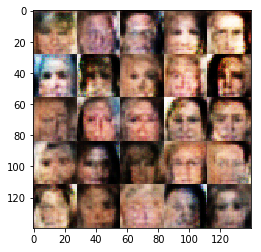

Epoch 2/2... Discriminator Loss: 8.8684... Generator Loss: 12238.3750


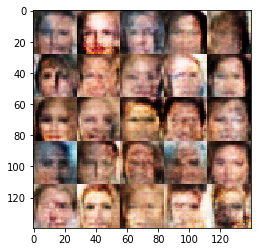

Epoch 2/2... Discriminator Loss: -48.1656... Generator Loss: 12210.7480


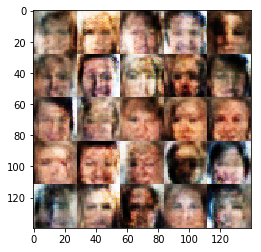

Epoch 2/2... Discriminator Loss: -41.2247... Generator Loss: 12186.9033


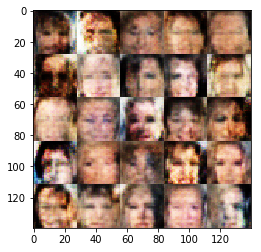

Epoch 2/2... Discriminator Loss: -60.9745... Generator Loss: 12097.8047


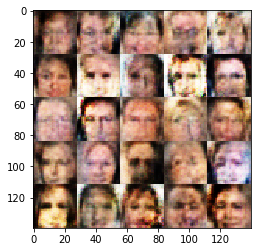

Epoch 2/2... Discriminator Loss: -6.0943... Generator Loss: 11892.3594


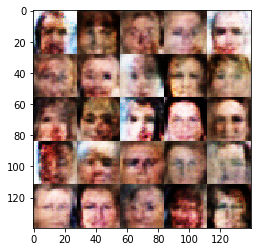

Epoch 2/2... Discriminator Loss: 510.6990... Generator Loss: 8866.7676


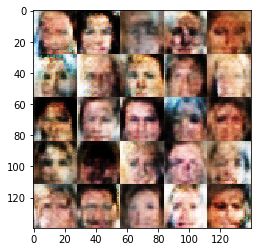

Epoch 2/2... Discriminator Loss: 32.5714... Generator Loss: 11788.4707


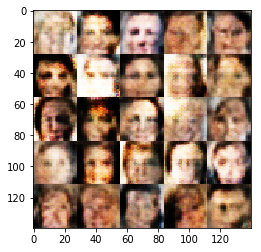

Epoch 2/2... Discriminator Loss: -510.6281... Generator Loss: 12881.9336


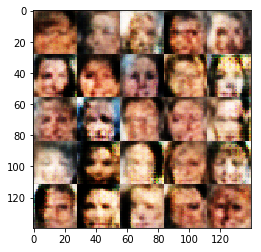

Epoch 2/2... Discriminator Loss: -183.1792... Generator Loss: 12709.2002


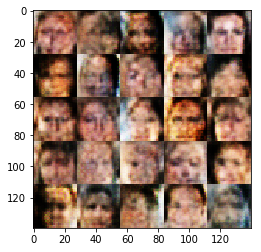

Epoch 2/2... Discriminator Loss: -278.8315... Generator Loss: 12640.4355


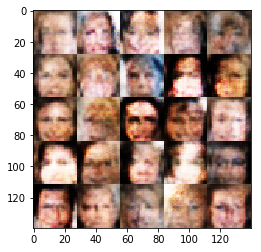

Epoch 2/2... Discriminator Loss: -2.6479... Generator Loss: 12699.4668


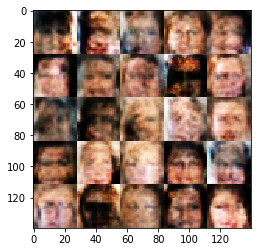

Epoch 2/2... Discriminator Loss: -15.6777... Generator Loss: 12568.5693


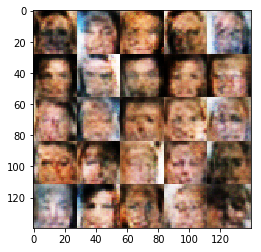

Epoch 2/2... Discriminator Loss: -39.6840... Generator Loss: 12596.2100


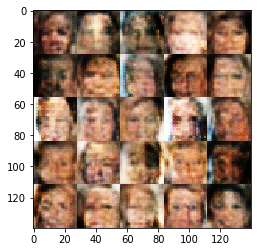

Epoch 2/2... Discriminator Loss: -50.8656... Generator Loss: 12454.3311


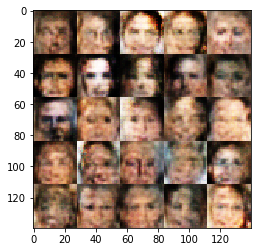

Epoch 2/2... Discriminator Loss: -60.5746... Generator Loss: 12384.0674


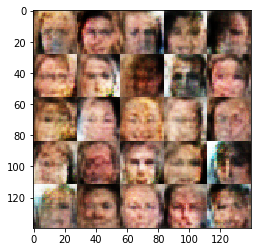

Epoch 2/2... Discriminator Loss: -179.3856... Generator Loss: 12271.8086


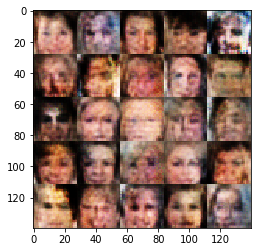

Epoch 2/2... Discriminator Loss: -98.9071... Generator Loss: 12329.7529


KeyboardInterrupt: 

In [85]:
batch_size = 64
z_dim = 100
learning_rate = 2e-4
beta1 = 0.5


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
epochs = 2

celeba_dataset = helper.Dataset('celeba', glob(os.path.join(data_dir, 'img_align_celeba/*.jpg')))
with tf.Graph().as_default():
    train(epochs, batch_size, z_dim, learning_rate, beta1, celeba_dataset.get_batches,
          celeba_dataset.shape, celeba_dataset.image_mode)

### Submitting This Project
When submitting this project, make sure to run all the cells before saving the notebook. Save the notebook file as "dlnd_face_generation.ipynb" and save it as a HTML file under "File" -> "Download as". Include the "helper.py" and "problem_unittests.py" files in your submission.